In [2]:
import torch
import torchvision.transforms as transforms
import torchvision.models as models
import requests
import matplotlib.pyplot as plt
from PIL import Image
from robustbench.utils import load_model
from torchattacks import PGD
import os
import torchvision

In [3]:
labels_map = {idx: label for idx, label in enumerate(requests.get("https://storage.googleapis.com/download.tensorflow.org/data/imagenet_class_index.json").json().values())}
standard_model = models.resnet50(pretrained=True)
standard_model.eval()

c:\Users\nasta\miniconda3\envs\adaexam\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
c:\Users\nasta\miniconda3\envs\adaexam\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): Bottleneck(
      (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (conv3): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn3): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (downsample): Sequential(
        (0): Conv2d(64, 256, kernel_size=(1, 1), stride=(1, 

In [4]:
def preprocess_images(image_paths):
    """Preprocess images for the model."""
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
    ])
    images = [transform(Image.open(path).convert("RGB")) for path in image_paths]
    return torch.stack(images)

def get_predictions(model, images, labels_map):
    """Get predictions from the model."""
    outputs = model(images)
    _, predicted = torch.max(outputs, 1)
    return [labels_map[idx.item()] for idx in predicted]

def apply_pgd_attack(model, images, labels, epsilon=0.03, alpha=0.01, iters=40):
    """Apply PGD attack to the images."""
    attack = PGD(model, eps=epsilon, alpha=alpha, steps=iters)
    return attack(images, labels)

def visualize_results(originals, perturbations, adversarials, model_name, labels_original, labels_adversarial):
    """Visualize the original, perturbation, and adversarial images."""
    batch_size = originals.shape[0]
    fig, axes = plt.subplots(batch_size, 3, figsize=(12, 4 * batch_size))
    fig.suptitle(f"Model: {model_name}", fontsize=16)
    
    for i in range(batch_size):
        titles = [f"Original: {labels_original[i][1]}", "Perturbation", f"Adversarial: {labels_adversarial[i][1]}"]
        # normalize perturbations so we can vizualize them
        perturbations_normalized = (perturbations - perturbations.min()) / (perturbations.max() - perturbations.min() + 1e-8)
        for j, img, title in zip(range(3), [originals[i], perturbations_normalized[i], adversarials[i]], titles):
            axes[i, j].imshow(img.permute(1, 2, 0).numpy().clip(0, 1))
            axes[i, j].set_title(title)
            axes[i, j].axis("off")
    
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()

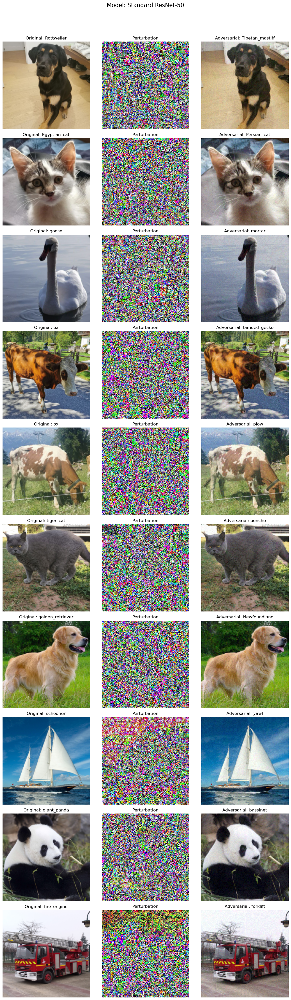

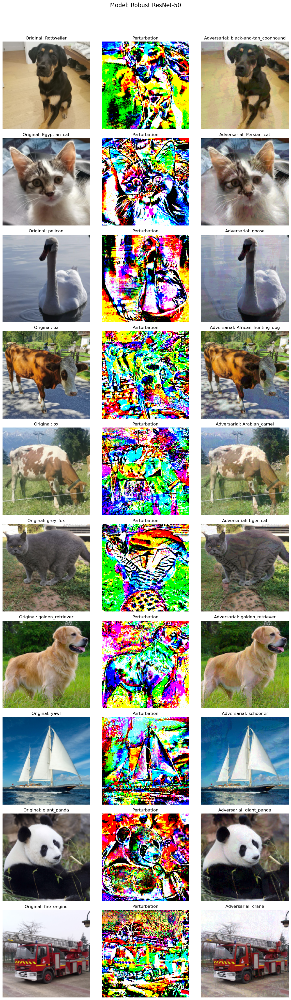

In [ ]:
# load the images
image_paths = ["Ressources/dog.jpg", "Ressources/kitten.jpg", "Ressources/swan.jpg", "Ressources/cow.jpg", "Ressources/cow2.jpg", "Ressources/cat.jpg", "Ressources/golden_retriever.jpg", "Ressources/boat.jpg", "Ressources/panda.jpg", "Ressources/truck.jpg"]
images = preprocess_images(image_paths)

# load the robust model
robust_model = load_model("Salman2020Do_50_2", dataset="imagenet", threat_model="Linf")
robust_model.eval()

labels_standard_original = get_predictions(standard_model, images, labels_map)
labels_robust_original = get_predictions(robust_model, images, labels_map)

perturbed_standard = apply_pgd_attack(standard_model, images, torch.tensor([list(labels_map.keys())[list(labels_map.values()).index(label)] for label in labels_standard_original]))
perturbed_robust = apply_pgd_attack(robust_model, images, torch.tensor([list(labels_map.keys())[list(labels_map.values()).index(label)] for label in labels_robust_original]))

labels_standard_adversarial = get_predictions(standard_model, perturbed_standard, labels_map)
labels_robust_adversarial = get_predictions(robust_model, perturbed_robust, labels_map)

perturbation_standard = (perturbed_standard - images)
perturbation_robust = (perturbed_robust - images)

visualize_results(images, perturbation_standard, perturbed_standard, "Standard ResNet-50", labels_standard_original, labels_standard_adversarial)
visualize_results(images, perturbation_robust, perturbed_robust, "Robust ResNet-50", labels_robust_original, labels_robust_adversarial)

In [2]:
def get_top5_predictions(model, images, labels_map):
    """Get top-5 predictions from the model."""
    outputs = model(images)
    probabilities = torch.nn.functional.softmax(outputs, dim=1)  # Convert to probabilities
    top5_probs, top5_indices = torch.topk(probabilities, 5, dim=1)  # Get top-5 predictions

    top5_results = []
    for i in range(5):
        idx = top5_indices[0, i].item()
        prob = top5_probs[0, i].item()
        top5_results.append((labels_map[idx], prob))

    return top5_results

In [8]:
# Load the image
panda_path = "Ressources/panda.jpg"
images = preprocess_images([panda_path])

In [ ]:
# Get original top-5 predictions
print("\nOriginal Image Top-5 Predictions:")
top5_original = get_top5_predictions(standard_model, images, labels_map)
for label, prob in top5_original:
    print(f"{label}: {prob:.4f}")

# Convert label to tensor (using the top-1 class)
label_tensor = torch.tensor([list(labels_map.keys())[list(labels_map.values()).index(top5_original[0][0])]])

perturbed_panda = apply_pgd_attack(standard_model, images, label_tensor)

# Get perturbed top-5 predictions
print("\nPerturbed Image Top-5 Predictions:")
top5_perturbed = get_top5_predictions(standard_model, perturbed_panda, labels_map)
for label, prob in top5_perturbed:
    print(f"{label}: {prob:.4f}")


Original Image Top-5 Predictions:
['n02510455', 'giant_panda']: 0.9593
['n02443114', 'polecat']: 0.0105
['n02447366', 'badger']: 0.0048
['n04399382', 'teddy']: 0.0045
['n02133161', 'American_black_bear']: 0.0030

Perturbed Image Top-5 Predictions:
['n02441942', 'weasel']: 1.0000
['n02442845', 'mink']: 0.0000
['n02443484', 'black-footed_ferret']: 0.0000
['n02443114', 'polecat']: 0.0000
['n02137549', 'mongoose']: 0.0000

Perturbed panda image and perturbation saved in 'output' folder.


In [ ]:
torchvision.utils.save_image(perturbed_panda[0], "panda_perturbed.jpg")

### Targeted PGD attack

In [11]:
weasel_image = preprocess_images(["Ressources/trailer_truck.jpg"])

top5_targeted = get_top5_predictions(standard_model, weasel_image, labels_map)
for label, prob in top5_targeted:
    print(f"{label}: {prob:.4f}")

['n04467665', 'trailer_truck']: 0.9688
['n03796401', 'moving_van']: 0.0214
['n03417042', 'garbage_truck']: 0.0089
['n04252225', 'snowplow']: 0.0003
['n03126707', 'crane']: 0.0002


In [12]:
import torchattacks

# Find truck class index in ImageNet labels
truck_idx = None
for idx, label in labels_map.items():
    if "weasel" in label[1].lower():
        truck_idx = idx
        print(f"Found weasel class: {label[1]} (index: {idx})")
        break

# Convert target_class to tensor
target_label = torch.tensor([truck_idx])

# Create PGD attack instance
atk = torchattacks.PGD(standard_model, eps=0.03, alpha=0.01, steps=40, random_start=True)

# Set attack mode to targeted
atk.set_mode_targeted_by_label()

# Apply targeted attack to make panda classified as truck
targeted_perturbed_panda = atk(weasel_image, target_label)

# Check if attack succeeded
print("\nTargeted Attack Top-5 Predictions:")
top5_targeted = get_top5_predictions(standard_model, targeted_perturbed_panda, labels_map)
for label, prob in top5_targeted:
    print(f"{label}: {prob:.4f}")

Found weasel class: weasel (index: 356)
Attack mode is changed to 'targeted(label)'.

Targeted Attack Top-5 Predictions:
['n02441942', 'weasel']: 1.0000
['n02091032', 'Italian_greyhound']: 0.0000
['n02423022', 'gazelle']: 0.0000
['n02443484', 'black-footed_ferret']: 0.0000
['n02091244', 'Ibizan_hound']: 0.0000


In [13]:
torchvision.utils.save_image(targeted_perturbed_panda, "output/truck_as_weasel.jpg")

## Targeted attacks for several images

In [5]:
import random
import shutil
from torchattacks import PGD
import torchvision
from tqdm import tqdm

def create_targeted_adversarials(model, class_id_source, class_id_output, num_images, 
                               output_dir="./adv_results", tinyimagenet_dir='./tiny-imagenet-200'):
    """
    Creates targeted adversarial examples between two ImageNet classes with organized output
    
    Parameters:
        model (nn.Module): Pretrained classifier
        class_id_source (str): Source class WordNet ID
        class_id_output (str): Target class WordNet ID
        num_images (int): Number of adversarial examples to create
        output_dir (str): Root directory for output
        tinyimagenet_dir (str): Path to Tiny ImageNet dataset
    """
    # Create output directories
    adv_dir = os.path.join(output_dir, "adv_ex")
    original_dir = os.path.join(output_dir, "original")
    others_dir = os.path.join(output_dir, "others")
    os.makedirs(adv_dir, exist_ok=True)
    os.makedirs(original_dir, exist_ok=True)
    os.makedirs(others_dir, exist_ok=True)

    # Get all source class images
    source_dir = os.path.join(tinyimagenet_dir, 'train', class_id_source, 'images')
    if not os.path.exists(source_dir):
        raise FileNotFoundError(f"Class {class_id_source} not found in dataset")
    
    all_images = [f for f in os.listdir(source_dir) 
                 if f.lower().endswith(('.jpeg', '.jpg', '.png'))]
    
    # Verify enough images
    if len(all_images) < 2*num_images:
        raise ValueError(f"Class {class_id_source} has only {len(all_images)} images, need {2*num_images}")
    
    # Select non-overlapping image sets
    selected = random.sample(all_images, 2*num_images)
    original_images = selected[:num_images]
    other_images = selected[num_images:2*num_images]

    # Get target class index
    target_idx = None
    for idx, label in labels_map.items():
        if "weasel" in label[1].lower():
            target_idx = idx
            break

    # Configure attack
    attack = PGD(model, eps=8/255, alpha=2/255, steps=40)
    attack.set_mode_targeted_by_label()

    # Process original images and create adversarials with progress bar
    for img_file in tqdm(original_images, desc="Creating adversarial examples", unit="image"):
    #for img_file in original_images:
        # Load and process image
        img_path = os.path.join(source_dir, img_file)
        image = preprocess_images([img_path])

        # Generate adversarial
        adv_image = attack(image, torch.tensor([target_idx]))
        
        # Save adversarial
        adv_path = os.path.join(adv_dir, img_file)
        torchvision.utils.save_image(adv_image, adv_path)

        # Save original
        shutil.copy(img_path, os.path.join(original_dir, img_file))

    # Save other images
    for img_file in other_images:
        src = os.path.join(source_dir, img_file)
        dst = os.path.join(others_dir, img_file)
        shutil.copy(src, dst)

    print(f"Created {num_images} adversarial examples in {output_dir}")


create_targeted_adversarials(
    model=standard_model,
    class_id_source='n02441942',  # Weasel
    class_id_output='n04467665',  # Trailer truck
    num_images=100,
    output_dir="./adv_examples/weasel"
)

create_targeted_adversarials(
    model=standard_model,
    class_id_source='n04467665',
    class_id_output='n02441942',
    num_images=100,
    output_dir="./adv_examples/trailer_truck"
)

Attack mode is changed to 'targeted(label)'.


Creating adversarial examples: 100%|██████████| 100/100 [34:41<00:00, 20.81s/image]


Created 100 adversarial examples in ./adv_examples/weasel
Attack mode is changed to 'targeted(label)'.


Creating adversarial examples: 100%|██████████| 100/100 [27:50<00:00, 16.70s/image]


Created 100 adversarial examples in ./adv_examples/trailer_truck
